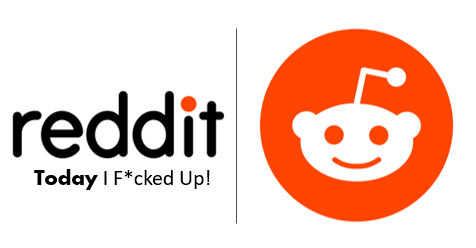

<hr style="border: 1px solid black;bmorder-radius: 5px">
<div style="text-align: center;vertical-align: middle;line-height: 45px;font-size: 25px;color:black;">In what ways can Redditors f*ck up?:  <br> Clustering the Today I F*cked Up(TIFU) SubReddit Section</div>
<hr style="border: 1px solid black;border-radius: 5px">

In [ ]:
from nltk.corpus import stopwords
import matplotlib.pyplot as plt
import numpy as np
import re
import pandas as pd
import seaborn as sns
from wordcloud import WordCloud, STOPWORDS
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.feature_extraction import stop_words
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA, TruncatedSVD
from sklearn.preprocessing import MinMaxScaler, StandardScaler, RobustScaler
from sklearn.metrics import calinski_harabasz_score, silhouette_score
from scipy.spatial.distance import euclidean, cityblock
from sklearn.base import clone
from wordcloud import WordCloud
%matplotlib inline

import bz2
import json
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

<div style="width: 250px;height: 50px;border: 3px solid black;box-sizing: border-box;text-align: center;vertical-align: middle;line-height: 45px;font-size: 20px;color:#FF4500;font-weight: bold;">EXECUTIVE SUMMARY</div>

<p style="text-align: justify">Reddit. com is coined as the "front page of the internet" which means that it is one of most popular and frequently visited website globally. Due to a lot of users, different topics and subreddit submission are being done everyday to the website. This in turn give the website a very wide array of topics to maintain. One popular subreddit is TIFU,  which contains stories from different people commiting mistakes and acts of stupidity. This study aims to uncover the common mistakes people make based on the submissions under the TIFU subreddit. This was achieved by first extracting the topics/concepts of the submissions using Latent Semantic Analysis and afterwards, K-means clustering was done to group submissions with similar concepts/topics.  </p>
 
<p style="text-align: justify">Based from these, 12 distinct topics / themes under the TIFU subreddits were identified, with topics ranging from sexual to work themes to romantic themes.</p> 

<div style="width: 200px;height: 50px;border: 3px solid black;box-sizing: border-box;text-align: center;vertical-align: middle;line-height: 45px;font-size: 20px;color:#FF4500;font-weight: bold;">INTRODUCTION</div>

## **REDDIT**

<p style="text-align: justify">Due to the rise of technology, almost all the people in the world can already use the internet. The increase of users on the internet will in turn also increase the popularity of different websites. One of the most popular websites as of today is the Reddit.com.</p>

<p style="text-align: justify">Reddit.com is a massive collection of different kinds of forums on the internet[1]. Users can post different kinds of topics, share different news, share original content, and comment on different subjects and areas of specialties. Users can also criticize, describe, and reply to each other’s posts which makes it like a social media platform. It is the Top 6 in the current lineup of popular websites in the United States and it’s on the Top 15th Place on the Global Scale as of August 2020 based on Alex.com[2]. It boasts its popularity because a lot of users can post different kinds of content, from simple posts to very creative memes. It is tagline “front page of the internet” is the most suitable description for the website due to its wide array of forum topics.</p>

<p style="text-align: justify">Being one of the top websites in the United States, it is expected that a lot of people view reddit.com from a day to day perspective. The topics you can find on Reddit are very scattered due to the number of users, which means that the ideas and posts of the users might be very similar or very different from each other. The clustering of these posts would make the generalization of topics in Reddit much more stable. Possible clustering of themes on the different topics you can see on Reddit would prove to be very beneficial in understanding the likes and dislikes of people in general. The study aims to check and describe the possible clustering labels on one of the topics in Reddit specifically the Today I Fucked Up (TIFU) Section. <br> <br> Sample Snapshot of Reddit can be seen on Figure 1[3]</p>


*Figure 1: Sample Screenshot of Reddit Main Page*
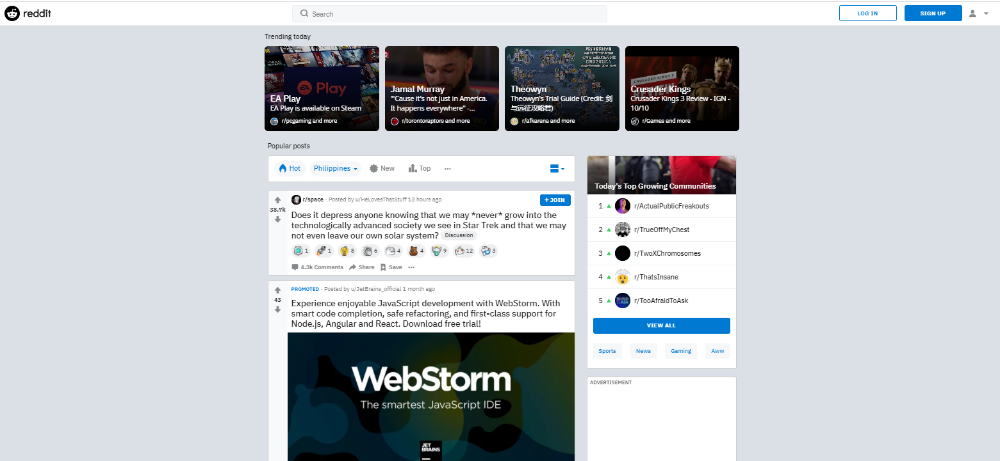

## **TIFU Subreddit**

<p style="text-align: justify">Fucked Up is a collection of different posts, forums, and contents that specifically target the events where a user was able to experience a not so good event. The description of the TIFU section can be described as the events where the users do some events and moments that are ridiculously stupid. Usually, the contents of these sections are very funny and amusing since a lot of users share their personal experiences through pictures and memes. One thing to note is that even though there are a lot of different experiences shared by different users, there is a possibility that some of these posts are very similar to each other. Due to this, the study will try to cluster all the TIFU Submissions on the given dataset and describe the underlying descriptions on the resulting cluster.. <br> <br> Sample Snapshot of TIFU Section can be seen on Figure 2[4]</p>
    

*Figure 2: Sample Screenshot of TIFU SECTION*
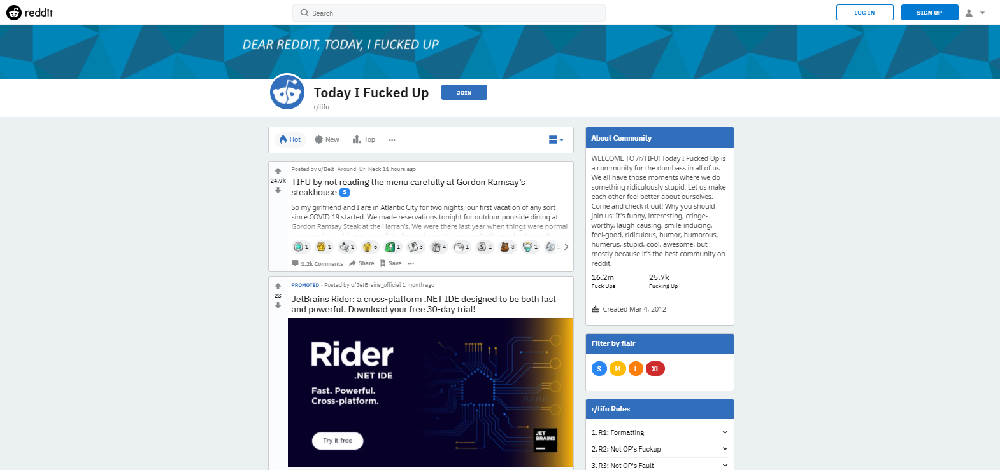

<div style="width: 260px;height: 50px;border: 3px solid black;box-sizing: border-box;text-align: center;vertical-align: middle;line-height: 45px;font-size: 20px;color:#FF4500;font-weight: bold;">PROBLEM STATEMENT</div>

  ###  *What kind of clustering labels/themes do redditors post on the Today I Fucked Up (TIFU) SubReddict Section?*


<div style="width: 200px;height: 50px;border: 3px solid black;box-sizing: border-box;text-align: center;vertical-align: middle;line-height: 45px;font-size: 20px;color:#FF4500;font-weight: bold;">BUSINESS VALUE</div>


- **Understanding People's Sentiments**: Using the Clustered Group and Description, we can generalize the sentiment of people on why there are events that is happening that are not desirable. This can be used for business that targets the uplifting of peoples lives through use of different new products and technologies.


- **Understanding Popularity**: Normally, clustering labels will be described based on the dominant words, which makes the labels sort of the most popular topics in reddit. This can be used by business and agencies in understanding customer needs.

<div style="width: 200px;height: 50px;border: 3px solid black;box-sizing: border-box;text-align: center;vertical-align: middle;line-height: 45px;font-size: 20px;color:#FF4500;font-weight: bold;">METHODOLOGY</div>

<p style="text-align: justify">To properly address the problem, the researchers will be needing viable data on regarding the different post about the TIFU SubReddit Section of Reddit. Note that there are a wide array of selection for possible collection of data 
but for this study we will using a public dataset that originated from the Jojie Server.The Researchers will follow the general workflow defined below to arrive at a conclusion and recommendation.</p>

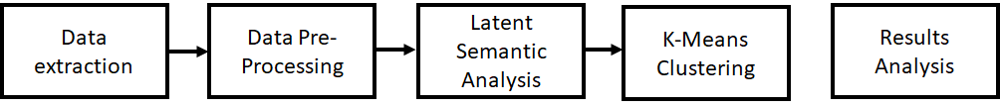

<div style="width: 220px;height: 50px;border: 3px solid black;box-sizing: border-box;text-align: center;vertical-align: middle;line-height: 45px;font-size: 20px;color:#FF4500;font-weight: bold;">DATA EXTRACTION</div>

A public dataset inside jojie server can be used with the following link:

        /mnt/data/public/reddit/submissions/*.xz
 
The Link above is an xz compressed file and the lzma library is needed to be able to parse the data on the file which is represented by the program below.

As the files contained all the submissions on reddit, only the first 1,500,00 lines per file were parsed through. Additionaly, only entries under the "TIFU" subeddit was stored.

In [ ]:
root = "/mnt/data/public/reddit/submissions/"

df_tifu = pd.DataFrame(columns=['titles'])
files = glob.glob(root + "/*.xz")

idx = 0
for item in files:
    with lzma.open(item, "r") as f:
        for i, line in enumerate(f):
            if i == 1_500_000: 
                break
            else:
                entry = json.loads(line.rstrip())
                try:
                    if entry['subreddit'].lower() == 'tifu':
                        idx+=1
                        df_tifu.loc[idx] = (entry['title'])
                except:
                    pass
            

### Data Description

The data contains the titles of submissions from November 2017 to October 2018

In [ ]:
df_tifu.head()

,titles
0,walking a girl to pick up her brother
1,letting six baby quail loose in my home
2,walking a girl to pick up her brother
3,keeping the already vaped bud from my cannabis...
4,almost getting hit by a car while riding my bike


In [ ]:
df_tifu.shape

(5125, 1)

<div style="width: 300px;height: 50px;border: 3px solid black;box-sizing: border-box;text-align: center;vertical-align: middle;line-height: 45px;font-size: 20px;color:#FF4500;font-weight: bold;">DATA PREPROCESSING</div>


Below are the steps in the data pre-processing:
1. Data Cleaning
2. Feature Extraction (TF-IDF Vectorization)
3. Latent Semantic Analysis

### Data Cleaning

The data was cleaned by dropping duplicates and any NaN values. The strings were also lowered.

In [ ]:
tifu_clean = df_tifu.dropna().drop_duplicates()
tifu_clean.titles = tifu_clean.titles.str.lower()

In [ ]:
tifu_clean.shape

(4447, 1)

### Feature Extraction with TF-IDF Vectorization

Since the titles are composed of different word and titles, we will be using frequency-inverse document frequency **TF-IDF vectorizer** to be able to have vector representation of each title. This vectorizer was used because it de-emphasizes very frequent and rare words, and by using these, the essence of each title can be better captured.

For the implementation, scikit-learn's TfidfVectorizer was used. For this problem, a word is considered all alphabetic characters bounded by a white-space. Stop words, or very common words in the English languages was also included on the vectorization process. A max_df of 0.995 and a min_df of 0.005 was used to only include words that were used between 0.5% and 99.5% of the time in the corpus.

In [ ]:
stopwords = ['tifu', 'today', 'i', 'fucked', 'up', 'and', 'my', 'to', 'wa']

vectorizer = TfidfVectorizer(token_pattern = r"[\w\']{2,}",
                             stop_words = list(STOPWORDS) + stopwords,
                            min_df = 0.005,
                            max_df = 0.995
                            )

bow = vectorizer.fit_transform(tifu_clean.titles)
bow = pd.DataFrame.sparse.from_spmatrix(bow, columns = vectorizer.vocabulary_)
bow

,walking,girl,brother,letting,home,almost,getting,car,turning,guy,...,old,gf,front,think,showing,running,money,dick,falling,test
0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.000000,0.628339,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4442,0.000000,0.562002,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4443,0.494464,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4444,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4445,1.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


<div style="width: 400px;height: 50px;border: 3px solid black;box-sizing: border-box;text-align: center;vertical-align: middle;line-height: 45px;font-size: 20px;color:#FF4500;font-weight: bold;">LATENT SEMANTIC ANALYSIS</div>

To be able to extract the text summaries or concepts from the documents (i.e. the reddit submissions), Latent Semantic Analysis (LSA) was performed. Also by using LSA, we can discard the dimensions and represent the documents in terms of the concepts, which could help improve quality of data representation. 

The implementation is shown below.

An explained variance threshold of 90% was used when reducing dimensions through Truncated SVD. This reduced the number of features from 141 to 111.

Explained Variance >= 0.9 at n = 111


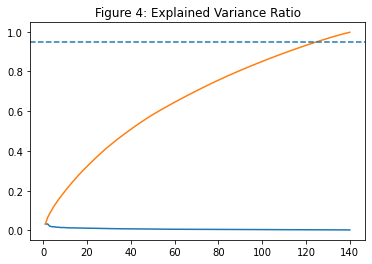

In [ ]:
svd = TruncatedSVD(n_components = bow.shape[1]-1,random_state=0)
svd.fit(bow)

plt.plot(range(1, bow.shape[1]), svd.explained_variance_ratio_)
plt.plot(range(1, bow.shape[1]), svd.explained_variance_ratio_.cumsum())
plt.axhline(0.95, ls = '--')
plt.title('Figure 4: Explained Variance Ratio')

n = np.argwhere(svd.explained_variance_ratio_.cumsum() > 0.9)[0][0]
print('Explained Variance >= 0.9 at n = {}'.format(n))

svd = TruncatedSVD(n_components = n,random_state=0)

X = svd.fit_transform(bow)

Examination of the dimensions reveal that the keywords are usually verbs but also some keywords such as 'accidentally', 'nsfw' and 'friend'.

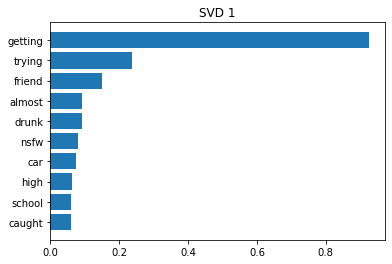

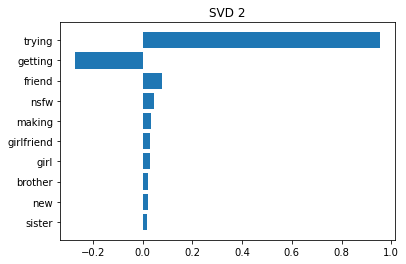

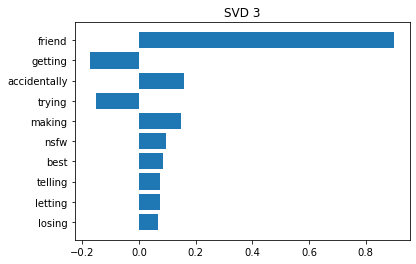

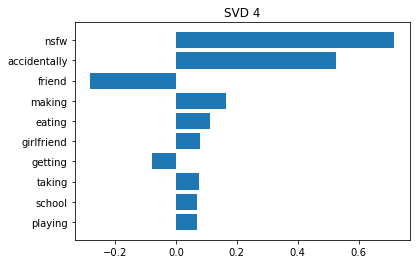

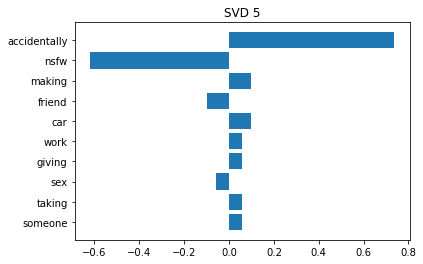

In [ ]:
for i in range(5):
    order = np.argsort(np.abs(svd.components_[i]))[-10:]
    plt.barh(np.array(vectorizer.get_feature_names())[order], svd.components_[i][order])
    plt.title(f'SVD {i+1}')
    plt.show()

<div style="width: 400px;height: 50px;border: 3px solid black;box-sizing: border-box;text-align: center;vertical-align: middle;line-height: 45px;font-size: 20px;color:#FF4500;font-weight: bold;">K-MEANS CLUSTERING</div>

With the documents now represented in terms of their concepts/topics via LSA, K-means clustering was done to cluster the submissions based on the topic.

The clustering was done through K-Means in the sklearn package. The clustering was seeded to make the work reproducible. The number of k-clusters was scanned from 4 to 13. We use the Sum of Squared Errors (SSE), Calinski-Harabasz Score (CH) and Silhouette score to determine the best number of k.

By examining the plots of these clustering scores below, a cluster value of k = 12 was chosen due to the slight elbow in SSE and a major spike in the Silhouette score. A higher number of clusters were chosen to be more descriptive of the themes of the submissions in the TIFU subreddit.

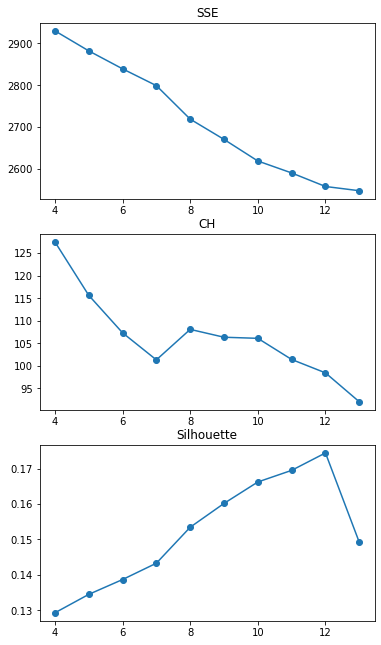

In [ ]:
SSE = []
CH = []
Silhouette = []

start = 4
end = 13

for k in range(start, end + 1):
    model = KMeans(n_clusters = k,random_state=1)
    y = model.fit_predict(X)
    
    SSE.append(model.inertia_)
    CH.append(calinski_harabasz_score(X, y))
    Silhouette.append(silhouette_score(X, y))
    
scores = list(zip([SSE, CH, Silhouette], ['SSE', 'CH', 'Silhouette']))

fig, ax = plt.subplots(3, figsize = (6,11))

for i in range(len(scores)):
    ax[i].plot(range(start, end+1), scores[i][0], marker = 'o')
    ax[i].set_title(scores[i][1])
    
plt.show()

In [ ]:
model = KMeans(n_clusters = 12,random_state=1)
y = model.fit_predict(X)

tifu_clean['cluster'] = y

<div style="width: 400px;height: 50px;border: 3px solid black;box-sizing: border-box;text-align: center;vertical-align: middle;line-height: 45px;font-size: 20px;color:#FF4500;font-weight: bold;">EDA</div>

The EDA is to be conducted primarily through WordCloud, as visual examination of the features is a good way to extract the dominant themes in the cluster.

By examining each cluster's wordcloud, the following dominant themes can be established among the TIFU submissions.

- Cluster 0: Involves getting caught doing something illegal or bad such as being drunk, hugh, plagiarizing, and being arrested.
- Cluster 1: Involves making or sending a mistake through the phone in school, or at home.
- Cluster 2: Revolves around the keyword 'trying' and includes very diverse failed attempts.
- Cluster 3: Revolves around the keyword 'girl' and 'love' which suggests romantic actions gone wrong.
- Cluster 4: Revolves around the keyword 'friend' which suggests mistakes with or at a friend.
- Cluster 5: Revolves around the keyword 'eating' and also shows dominant themes of food (also includes bad experiences in the bathroom)
- Cluster 6: Revolves around the keyword 'accidentally' and includes very diverse accidents.
- Cluster 7: Revolves around the keyword 'taking' which may involve consumption of medicine or other undesirable substances.
- Cluster 8: Revolves around the keyword 'car' and other auto-related words such as 'key', 'driving' and 'uber'
- Cluster 9: Involves a lot of sexual keywords.
- Cluster 10: Revolves around the keyword 'girlfriend' and includes a diverse set of accidents involving the poor women.
- Cluster 11: Involves work-related accidents relating to the keywords 'job' and 'work'

Another insight from these cluster themes is that the TIFU subreddit constantly mentions 'girl' or 'girlfriend' but never the male counterpart. This implies that the TIFU subreddit submissions are written and read by a predominantly male audience, which is consistent with redditors being predominantly male.

In [ ]:
def word_cloud(data, cols):
    """Returns word cloud representation"""
    tot = len(data['cluster'].unique())
    rows = tot // cols 
    rows += tot % cols
    pos = range(1,tot + 1)
    fig = plt.figure(dpi=200, figsize=(9*cols, 7*rows))

    for k in range(tot):
        cluster = ' '.join(data.query(f'cluster=={k}')['titles'])

        wordcloud = WordCloud(stopwords = list(STOPWORDS) + stopwords,
                              background_color = 'white',
                              width=800, height=600,
                              random_state=1).generate(cluster)
        ax = fig.add_subplot(rows,cols,pos[k])
        ax.imshow(wordcloud);
        ax.axis('off');
        ax.set_title(f"Common Themes for Cluster {k}")

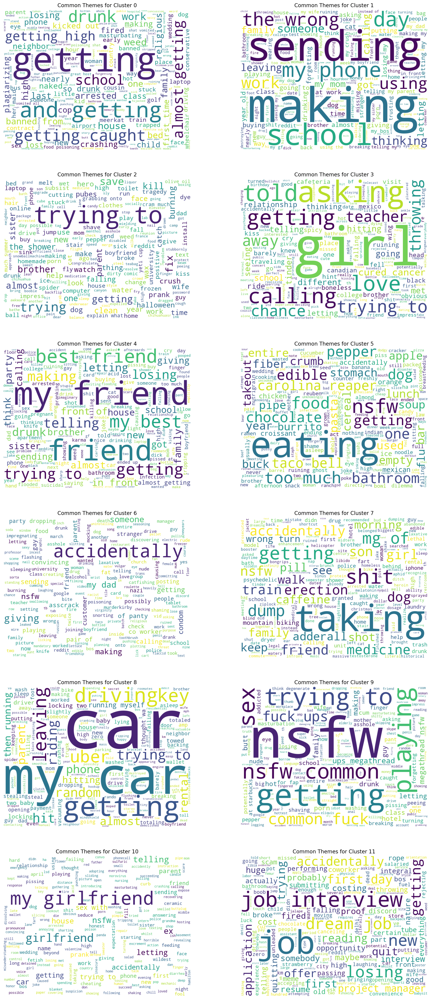

In [ ]:
word_cloud(tifu_clean,2)

<div style="width: 430px;height: 50px;border: 3px solid black;box-sizing: border-box;text-align: center;vertical-align: middle;line-height: 45px;font-size: 20px;color:#FF4500;font-weight: bold;">CONCLUSION AND RECOMMENDATION</div>

A dataset of Subreddit Titles were clustered based on texts information on the titles. These text informations were vectorized using the Term Frequency-Inverse Document Frequency (TFIDF) vectorization. From here, each unique TIFU Submission was labelled by cluster according to KMeans clustering verified through multiple clustering scores.

To give an appropriate title/description to the clusters, EDA through WordCloud was performed on the text information of the clusters to see their defining factors. Clear and consistent patterns across different features were observed, which served to reinforce the description of the clusters. 

A total of 12 clusters / dominant themes were found across the TIFU subreddit. These themes range from sexual to work themes to romantic themes.

The labels on these titles and TIFU Submissions can be used to better understand how redditors perceive mistakes and how these are narrated.

<div style="width: 450px;height: 50px;border: 3px solid black;box-sizing: border-box;text-align: center;vertical-align: middle;line-height: 45px;font-size: 20px;color:#FF4500;font-weight: bold;">REFERENCES AND ACKNOWLEDGEMENTS</div>

[1] https://www.digitaltrends.com/web/what-is-reddit/

[2] https://www.alexa.com/topsites/countries/US

[3] https://www.reddit.com/hot/

[4] https://www.reddit.com/r/tifu/